In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from statsmodels.tsa.seasonal import STL
from prophet.plot import add_changepoints_to_plot
from prophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()
import math
from sklearn.metrics import mean_squared_error
%matplotlib inline

In [57]:
# !pip install prophet

In [4]:
data = pd.read_csv ('Compiled.csv')

In [5]:
data.columns

Index(['Unnamed: 0', 'index', 'load', 'pressure', 'cloud_cov', 'humid', 'temp',
       'wind_dir', 'wind_sp', 'pressure_f', 'cloud_cov_f', 'temp_f',
       'wind_dir_f', 'wind_sp_f', 'date', 'month', 'hour', 'type_of_day',
       'day', ' year', 'covid', 'pub_hol', 'tue', 'wed', 'thu', 'fri', 'sat',
       'sun', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct',
       'nov', 'dec', 'h1', 'h2', 'h3', 'h4', 'h5', 'h6', 'h7', 'h8', 'h9',
       'h10', 'h11', 'h12', 'h13', 'h14', 'h15', 'h16', 'h17', 'h18', 'h19',
       'h20', 'h21', 'h22', 'h23', 'hour_sin', 'hour_cos', 'month_sin',
       'month_cos', 'day_sin', 'day_cos', 'datetime'],
      dtype='object')

In [7]:
summary = data.describe()

In [15]:
summary

,Unnamed: 0,index,load,pressure,cloud_cov,humid,temp,wind_dir,wind_sp,pressure_f,...,h20,h21,h22,h23,hour_sin,hour_cos,month_sin,month_cos,day_sin,day_cos
count,33600.000000,33600.000000,3.360000e+04,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,...,33600.000000,33600.000000,33600.000000,33600.000000,3.360000e+04,3.360000e+04,3.360000e+04,3.360000e+04,3.360000e+04,33600.000000
mean,16799.500000,15181.917143,1.149484e+06,1009.359705,40.331600,79.870794,16.788173,210.103824,12.750937,1009.242143,...,0.041667,0.041667,0.041667,0.041667,2.326182e-18,-4.573062e-18,-4.017078e-02,-2.201465e-02,1.280813e-03,-0.015591
std,9699.628859,9563.793590,1.490050e+05,3.985596,32.407708,11.211579,5.736650,93.872373,6.646783,3.881960,...,0.199829,0.199829,0.199829,0.199829,7.071173e-01,7.071173e-01,6.987290e-01,7.139391e-01,7.133855e-01,0.700618
min,0.000000,0.000000,8.454714e+05,950.595000,0.000000,33.333333,-6.418114,0.000000,0.000000,994.000000,...,0.000000,0.000000,0.000000,0.000000,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-9.987165e-01,-0.994869
25%,8399.750000,6695.750000,1.030119e+06,1006.240937,9.343750,72.416667,13.489386,128.500000,7.698750,1006.000000,...,0.000000,0.000000,0.000000,0.000000,-7.071068e-01,-7.071068e-01,-8.660254e-01,-8.660254e-01,-7.247928e-01,-0.758758
50%,16799.500000,15095.500000,1.112679e+06,1009.820000,40.875000,81.833333,16.724386,239.375000,12.016250,1010.000000,...,0.000000,0.000000,0.000000,0.000000,6.100000e-17,-6.140000e-17,-2.450000e-16,-1.840000e-16,-2.450000e-16,-0.050649
75%,25199.250000,23495.250000,1.251911e+06,1012.350000,75.000000,88.833333,20.541886,285.375000,17.813750,1012.000000,...,0.000000,0.000000,0.000000,0.000000,7.071068e-01,7.071068e-01,5.000000e-01,8.660254e-01,7.247928e-01,0.688967
max,33599.000000,31895.000000,1.605192e+06,1022.915000,100.000000,100.000000,39.066886,357.500000,91.497500,1020.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,9.987165e-01,1.000000


In [14]:
for row in summary.columns:
    print(row)

Unnamed: 0
index
load
pressure
cloud_cov
humid
temp
wind_dir
wind_sp
pressure_f
cloud_cov_f
temp_f
wind_dir_f
wind_sp_f
month
hour
type_of_day
day
 year
covid
pub_hol
tue
wed
thu
fri
sat
sun
feb
mar
apr
may
jun
jul
aug
sep
oct
nov
dec
h1
h2
h3
h4
h5
h6
h7
h8
h9
h10
h11
h12
h13
h14
h15
h16
h17
h18
h19
h20
h21
h22
h23
hour_sin
hour_cos
month_sin
month_cos
day_sin
day_cos


In [146]:
data.drop(columns=['Unnamed: 0', 'index'], inplace=True)

In [147]:
data = data.rename(columns={'datetime': 'ds',
                        'load': 'y'})

In [148]:
data['ds'] = pd.to_datetime(data['ds'])

/var/folders/34/n9z2vp496dx5gwr2m5_w4p780000gn/T/ipykernel_9381/1691921105.py:1: UserWarning:

Parsing dates in %d/%m/%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



In [137]:
# data.set_index('ds', inplace=True)

In [149]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33600 entries, 0 to 33599
Data columns (total 67 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   y            33600 non-null  float64       
 1   pressure     33600 non-null  float64       
 2   cloud_cov    33600 non-null  float64       
 3   humid        33600 non-null  float64       
 4   temp         33600 non-null  float64       
 5   wind_dir     33600 non-null  float64       
 6   wind_sp      33600 non-null  float64       
 7   pressure_f   33600 non-null  float64       
 8   cloud_cov_f  33600 non-null  float64       
 9   temp_f       33600 non-null  float64       
 10  wind_dir_f   33600 non-null  float64       
 11  wind_sp_f    33600 non-null  float64       
 12  date         33600 non-null  object        
 13  month        33600 non-null  int64         
 14  hour         33600 non-null  int64         
 15  type_of_day  33600 non-null  int64         
 16  day 

In [150]:
data.head()

,y,pressure,cloud_cov,humid,temp,wind_dir,wind_sp,pressure_f,cloud_cov_f,temp_f,...,h21,h22,h23,hour_sin,hour_cos,month_sin,month_cos,day_sin,day_cos,ds
0,1.031472e+06,1012.48000,2.125,79.333333,16.764386,285.25,6.25375,1011.0,3.0,14.0,...,0,0,0,0.000000,1.000000,1.0,6.120000e-17,-0.485302,-0.874347,2017-03-18 00:00:00
1,1.007206e+06,1011.61875,0.000,82.166667,15.729386,285.00,9.20500,1011.0,4.0,14.0,...,0,0,0,0.258819,0.965926,1.0,6.120000e-17,-0.485302,-0.874347,2017-03-18 01:00:00
2,9.861084e+05,1010.72000,2.125,81.666667,15.816886,316.00,11.28375,1011.0,4.0,14.0,...,0,0,0,0.500000,0.866025,1.0,6.120000e-17,-0.485302,-0.874347,2017-03-18 02:00:00
3,9.707610e+05,1011.37625,17.125,82.250000,15.919386,327.00,7.16875,1011.0,4.0,14.0,...,0,0,0,0.707107,0.707107,1.0,6.120000e-17,-0.485302,-0.874347,2017-03-18 03:00:00
4,9.622584e+05,1011.50000,18.625,82.333333,15.769386,282.25,0.78000,1011.0,4.0,14.0,...,0,0,0,0.866025,0.500000,1.0,6.120000e-17,-0.485302,-0.874347,2017-03-18 04:00:00


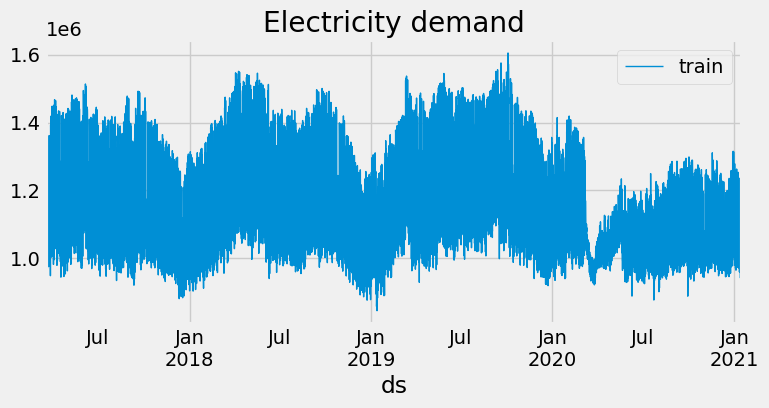

In [152]:
# Time series plot
# ==============================================================================
fig, ax = plt.subplots(figsize=(8, 3.5))
data.set_index('ds').y.plot(ax=ax, label='train', linewidth=1)
ax.set_title('Electricity demand')
ax.legend();

Plotting for each year:

In [85]:
def split_years(dt):
    return  dt.resample('Y')

In [86]:
yearly_splits = data.resample('Y')
for year, group in yearly_splits:
    print(f"Year: {year.year}")
    print(group)
    print("-------------------------------------")


Year: 2017
                     index             y    pressure  cloud_cov      humid  \
ds                                                                           
2017-03-18 00:00:00      0  1.031472e+06  1012.48000      2.125  79.333333   
2017-03-18 01:00:00      1  1.007206e+06  1011.61875      0.000  82.166667   
2017-03-18 02:00:00      2  9.861084e+05  1010.72000      2.125  81.666667   
2017-03-18 03:00:00      3  9.707610e+05  1011.37625     17.125  82.250000   
2017-03-18 04:00:00      4  9.622584e+05  1011.50000     18.625  82.333333   
...                    ...           ...         ...        ...        ...   
2017-12-31 19:00:00   6931  1.015638e+06  1014.47000      0.000  67.333333   
2017-12-31 20:00:00   6932  1.007444e+06  1013.76500      0.000  67.333333   
2017-12-31 21:00:00   6933  9.981465e+05  1012.27250      0.000  67.083333   
2017-12-31 22:00:00   6934  9.843710e+05  1012.18500      0.000  69.416667   
2017-12-31 23:00:00   6935  9.643236e+05  1012.75875 

In [28]:
split_years_dfs = split_years(data.set_index('ds'))

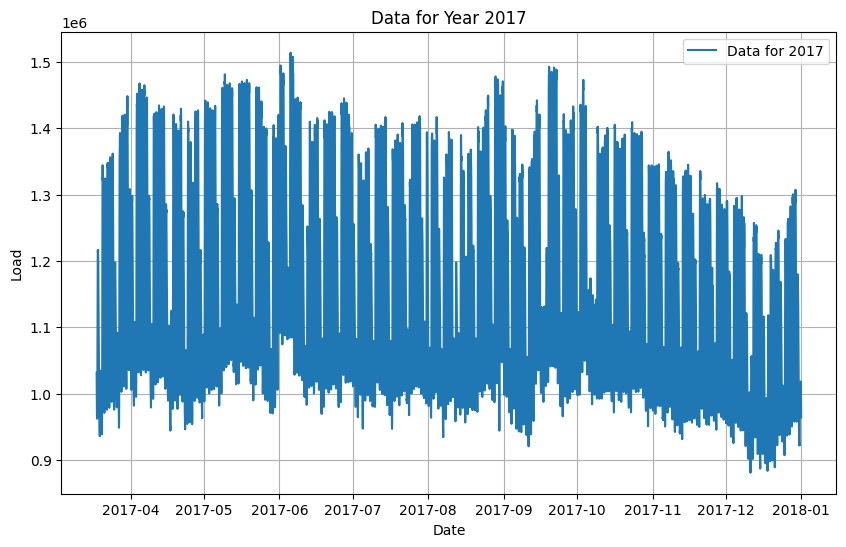

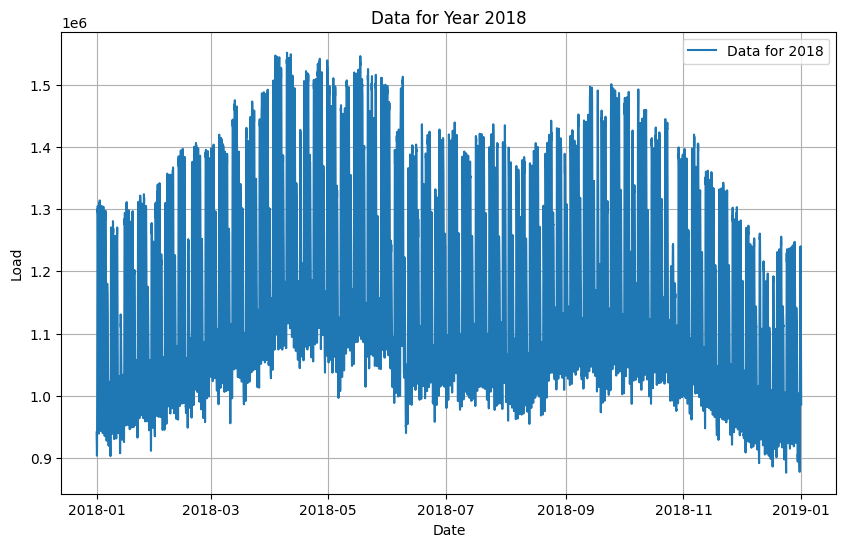

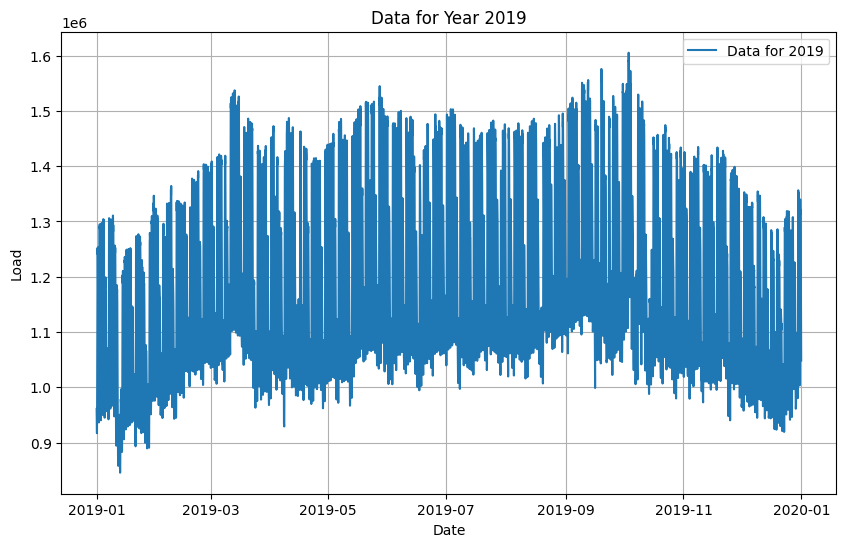

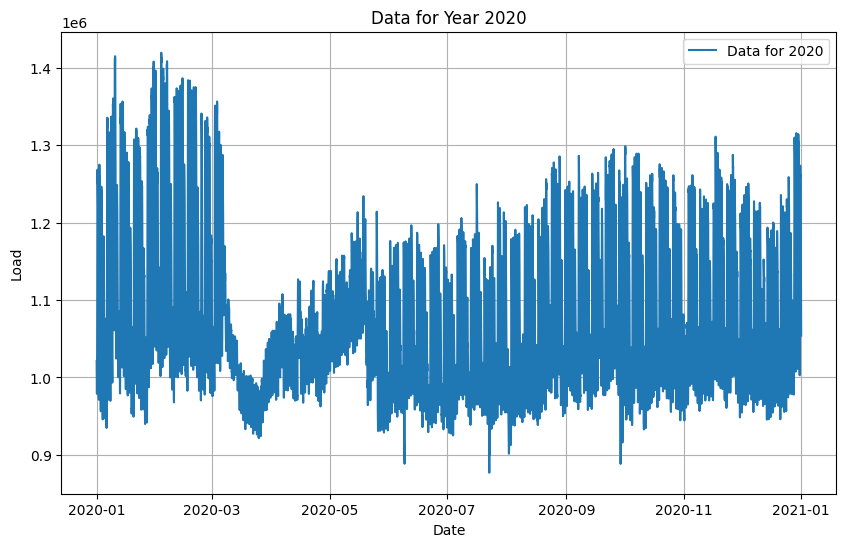

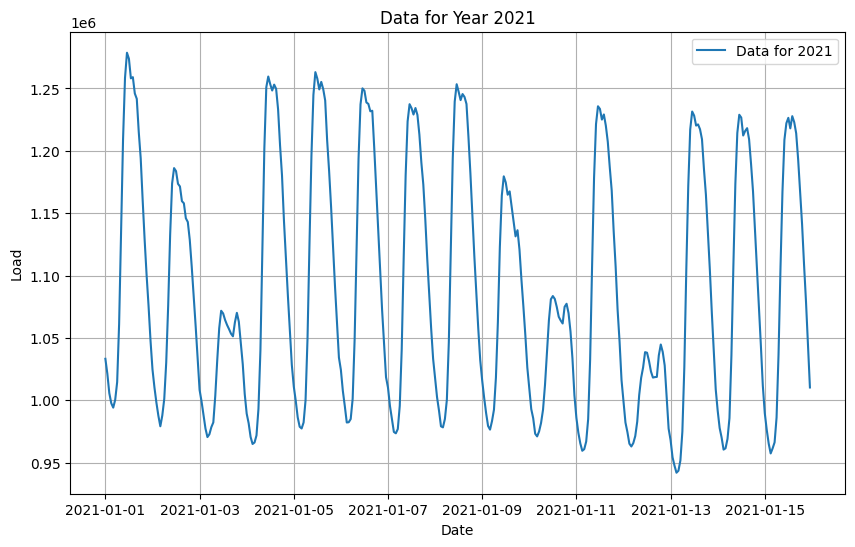

In [30]:
for year, group in yearly_splits:
    plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
    plt.plot(group.index, group['load'], label=f'Data for {year.year}')
    plt.xlabel('Date')
    plt.ylabel('Load')
    plt.title(f'Data for Year {year.year}')
    plt.legend()
    plt.grid()
    plt.show()

seasonal decomposition:

In [44]:
def get_seasonal_decompositions(dfs, period):
    for year, group in dfs:

        print(str(year.year).upper())
        # Perform seasonal decomposition
        stl = STL(group['load'], seasonal=period)  # You can adjust the seasonal period
        result = stl.fit()

        # Plot the decomposition
        plt.figure(figsize=(16, 8))

        plt.subplot(4, 1, 1)
        plt.plot(group.index, group['load'], label='Original Data')
        plt.legend()

        plt.subplot(4, 1, 2)
        plt.plot(group.index, result.trend, label='Trend')
        plt.legend()

        plt.subplot(4, 1, 3)
        plt.plot(group.index, result.seasonal, label='Seasonal')
        plt.legend()

        plt.subplot(4, 1, 4)
        plt.plot(group.index, result.resid, label='Residual')
        plt.legend()

        plt.tight_layout()
        plt.show()


2017


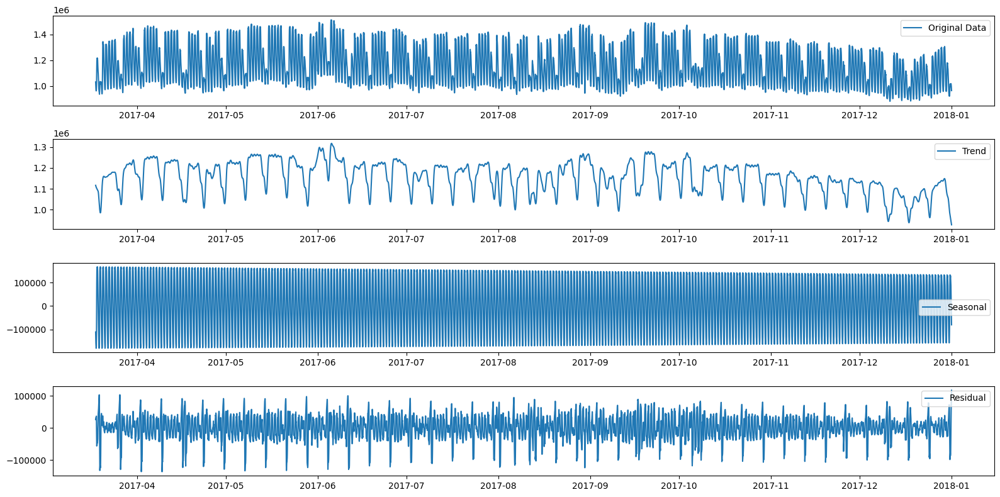

2018


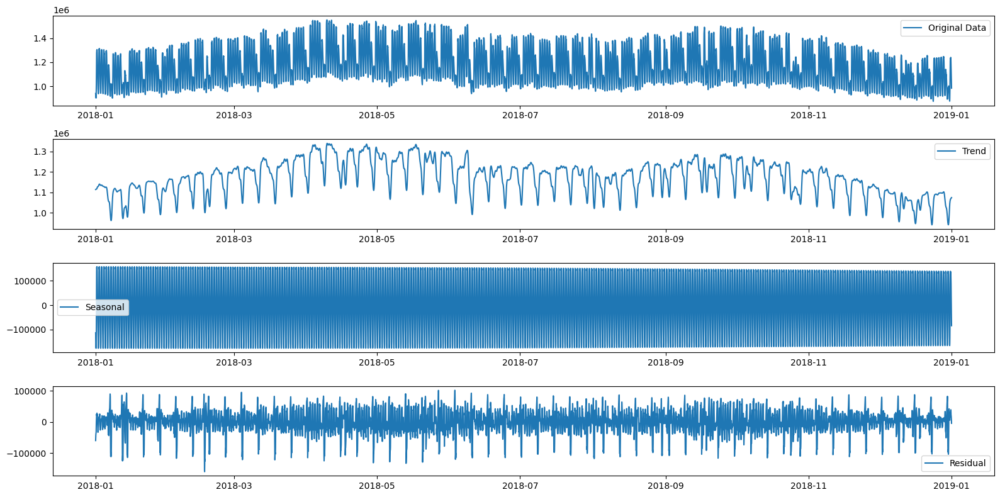

2019


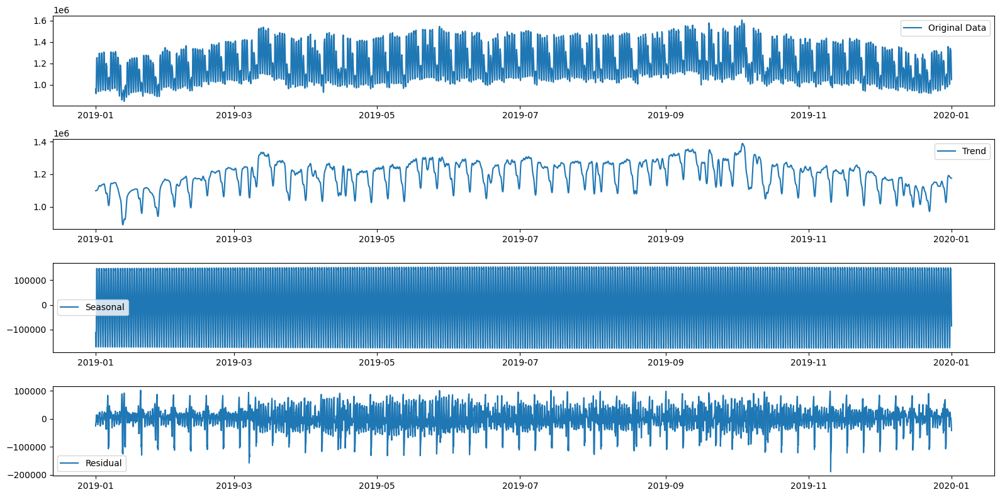

2020


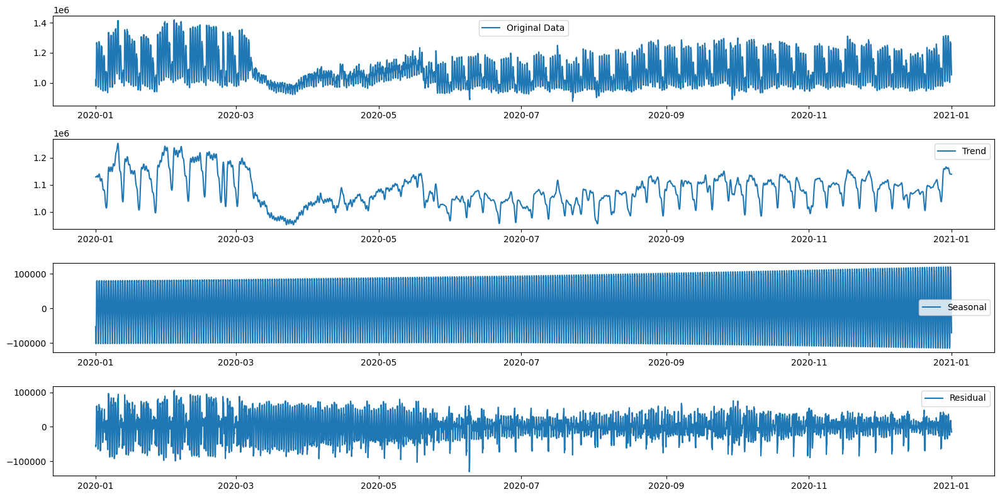

2021


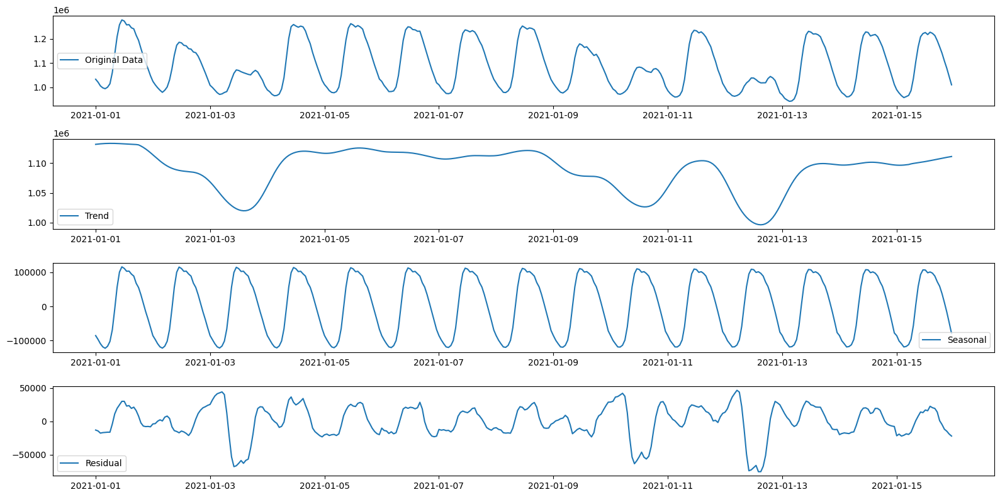

In [49]:
# yearly:
get_seasonal_decompositions(yearly_splits, 721)

2017


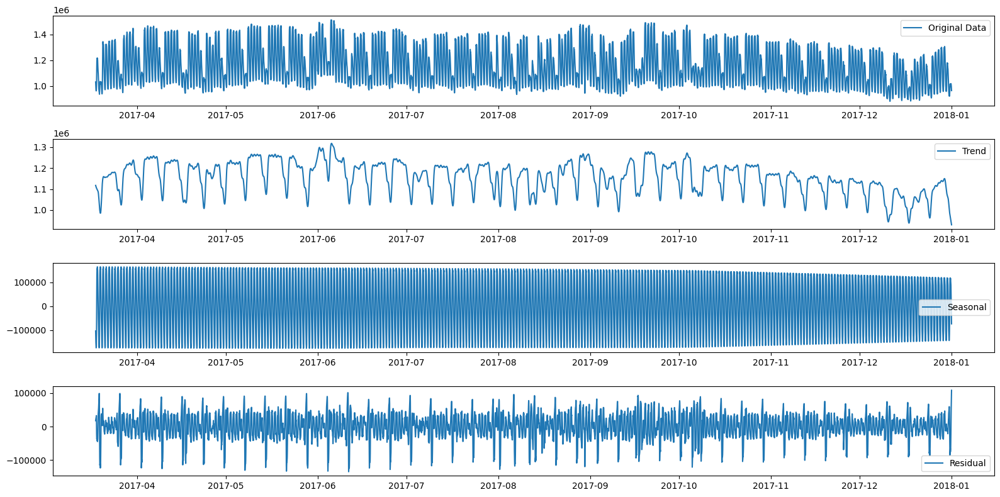

2018


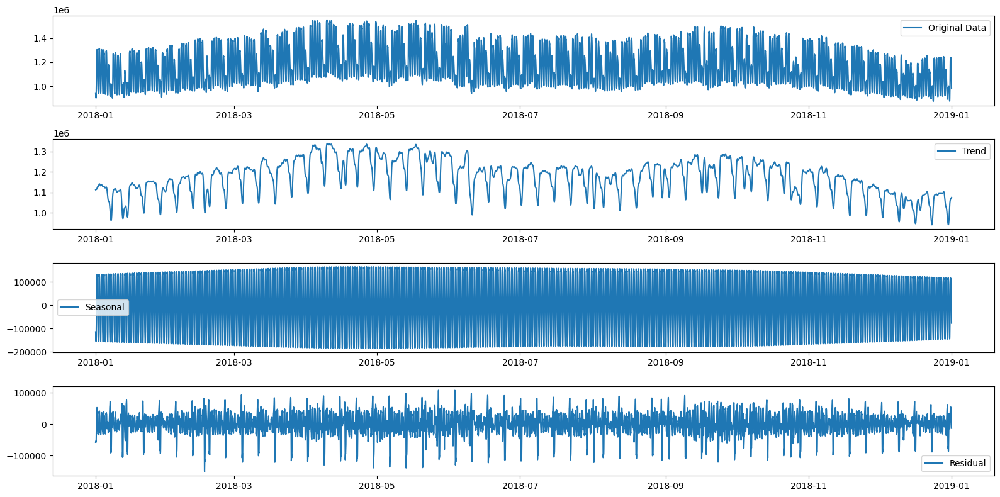

2019


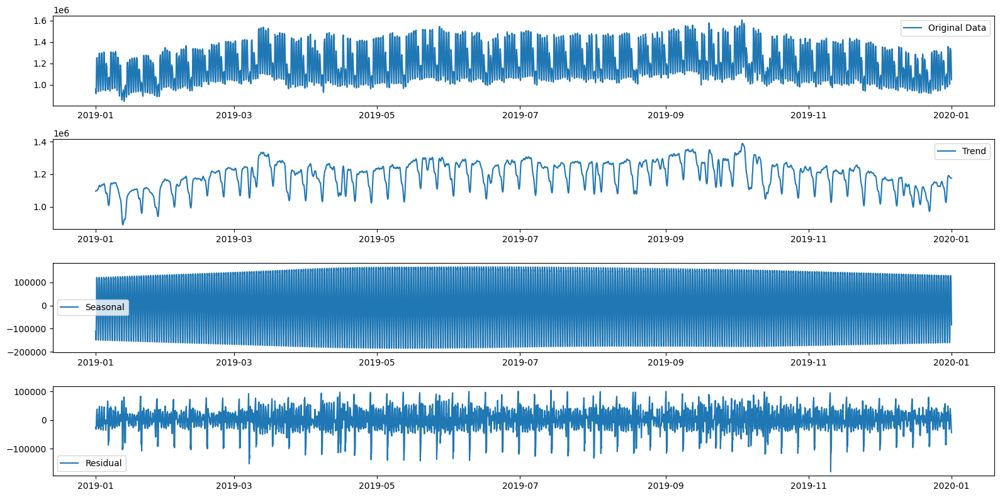

2020


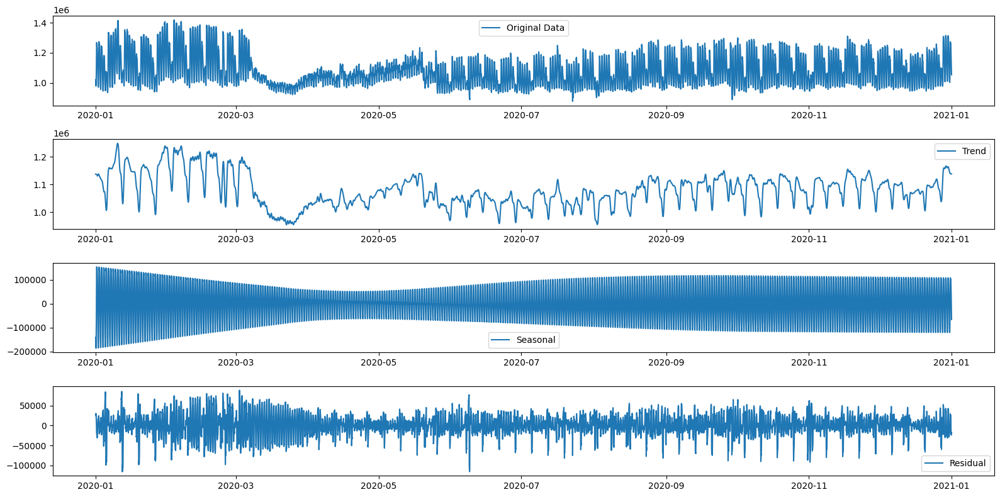

2021


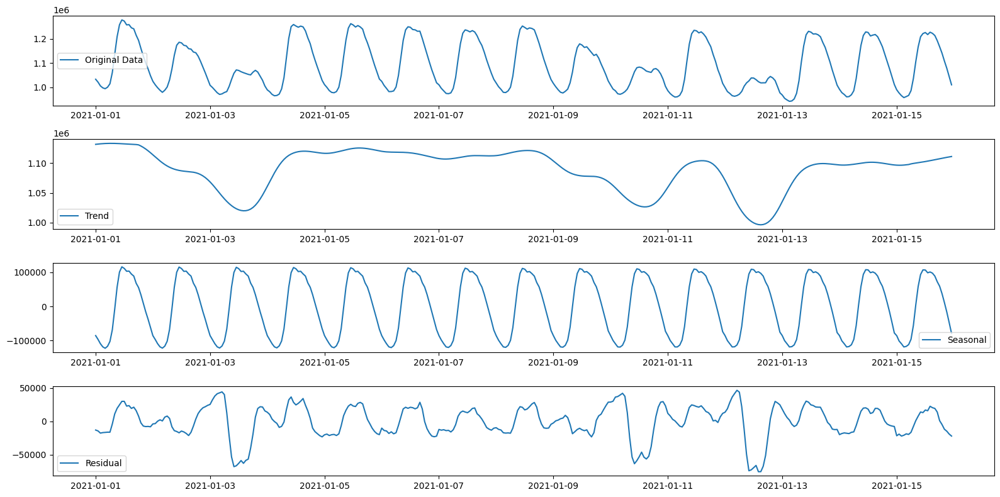

In [51]:
# weekly:
get_seasonal_decompositions(yearly_splits, 169)

2017


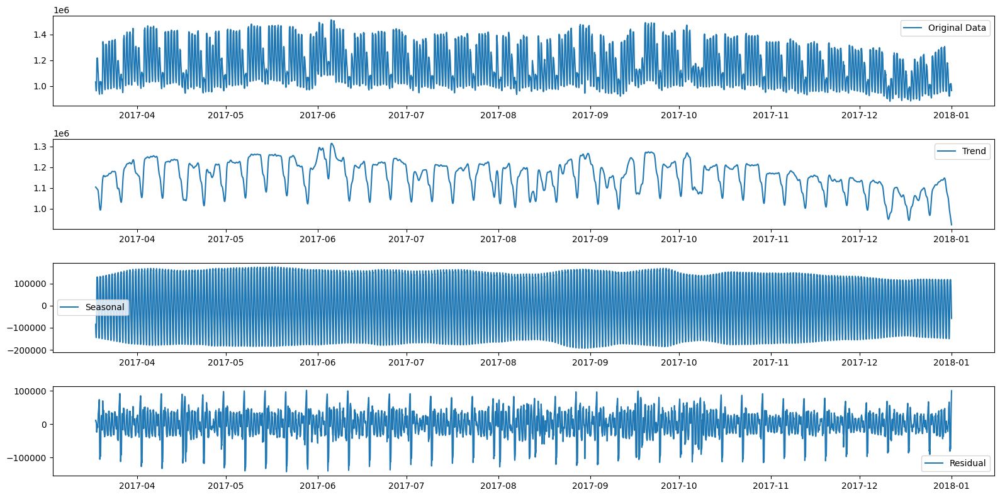

2018


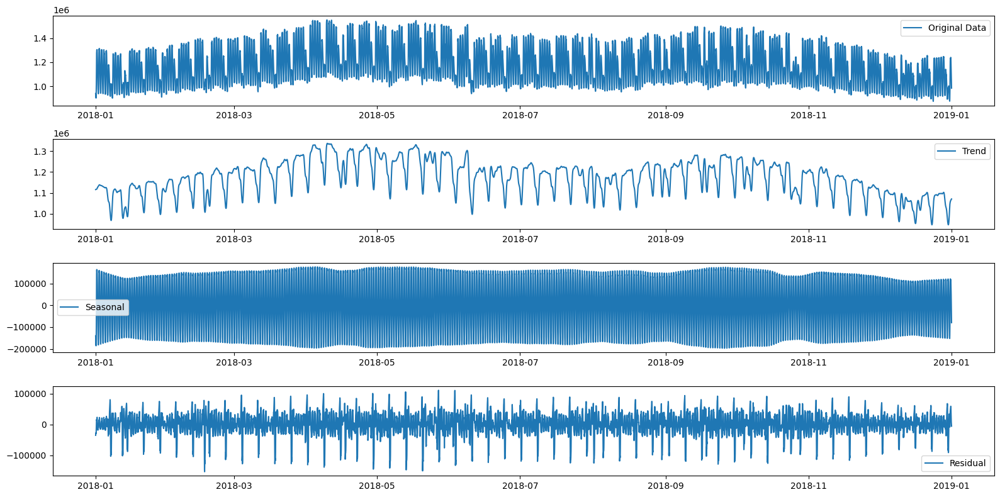

2019


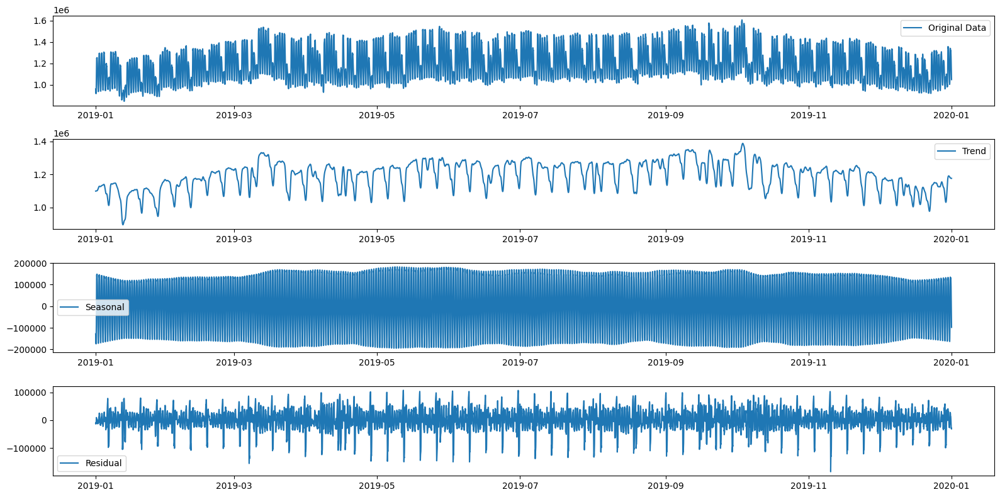

2020


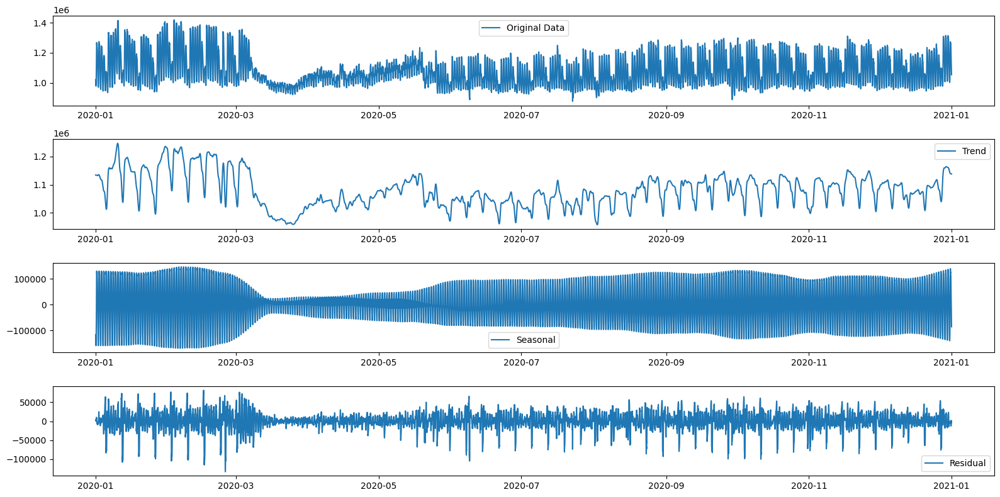

2021


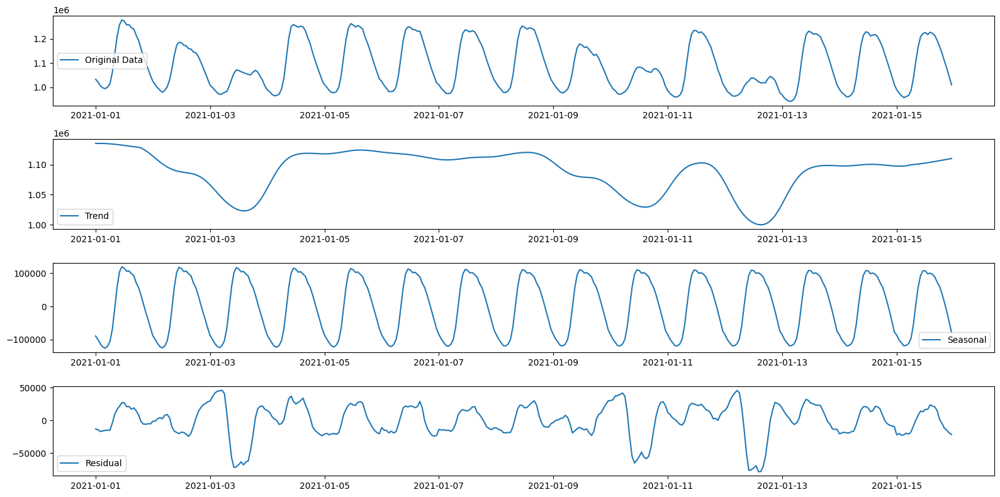

In [53]:
# daily:
get_seasonal_decompositions(yearly_splits, 25)

Get the data ready:

In [87]:
# Define the window size for historical data and forecast
window_size = 168  # Number of past data points to consider
forecast_size = 48  # Number of future data points to forecast

In [153]:
data.columns

Index(['y', 'pressure', 'cloud_cov', 'humid', 'temp', 'wind_dir', 'wind_sp',
       'pressure_f', 'cloud_cov_f', 'temp_f', 'wind_dir_f', 'wind_sp_f',
       'date', 'month', 'hour', 'type_of_day', 'day', ' year', 'covid',
       'pub_hol', 'tue', 'wed', 'thu', 'fri', 'sat', 'sun', 'feb', 'mar',
       'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec', 'h1',
       'h2', 'h3', 'h4', 'h5', 'h6', 'h7', 'h8', 'h9', 'h10', 'h11', 'h12',
       'h13', 'h14', 'h15', 'h16', 'h17', 'h18', 'h19', 'h20', 'h21', 'h22',
       'h23', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'day_sin',
       'day_cos', 'ds'],
      dtype='object')

In [560]:
# for the time being, remove humidity
actual_columns = ['ds'] + ['y'] + ['pressure', 'cloud_cov', 'temp', 'wind_dir',
       'wind_sp']

In [561]:
forecast_columns = ['ds'] + ['y'] + ['pressure_f', 'cloud_cov_f', 'temp_f', 'wind_dir_f',
       'wind_sp_f']

In [562]:
columns = ['ds'] + ['y'] + forecast_columns

Prepare the data:

In [519]:
fb_data = data[columns]

In [563]:
actual_data = data[actual_columns]

In [564]:
forecast_data = data[forecast_columns]

In [175]:
def split_data(data, test_size=0.1):
    return np.split(data, [int((1 - test_size) * data.shape[0]) + 1])

In [520]:
train_data, test_data = split_data(fb_data, 0.1)

In [521]:
train_data.head()

,ds,y,pressure_f,cloud_cov_f,temp_f,wind_dir_f,wind_sp_f
0,2017-03-18 00:00:00,1.031472e+06,1011.0,3.0,14.0,307.0,2.0
1,2017-03-18 01:00:00,1.007206e+06,1011.0,4.0,14.0,215.0,2.0
2,2017-03-18 02:00:00,9.861084e+05,1011.0,4.0,14.0,123.0,1.0
3,2017-03-18 03:00:00,9.707610e+05,1011.0,4.0,14.0,31.0,1.0
4,2017-03-18 04:00:00,9.622584e+05,1011.0,4.0,14.0,138.0,1.0


### Modelling:

In [522]:
model = Prophet(interval_width=0.95, changepoint_range=0.9)

In [523]:
for col in forecast_columns:
    if col == 'y' or col=='ds': 
        pass
    else:
        model.add_regressor(col)

In [524]:
model.fit(train_data)

INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


In [389]:
# model.params

Testing prediction for the next 48 hours for now:

In [525]:
future = test_data.drop(columns = ['y'])[:48]

In [526]:
test_forecast = model.predict(future)

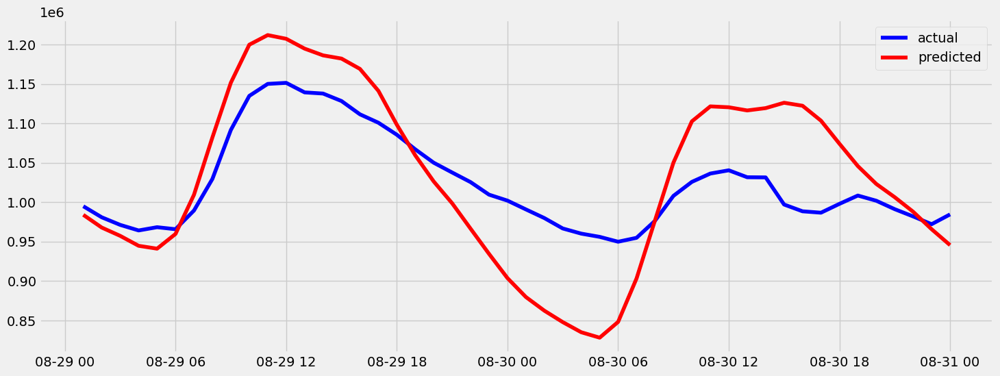

In [527]:
plt.figure(figsize=(16,6))
plt.plot(test_data['ds'][:48], test_data['y'][:48], color='blue', label='actual')
plt.plot(test_forecast['ds'], test_forecast['yhat'], color='red', label='predicted')
plt.legend()

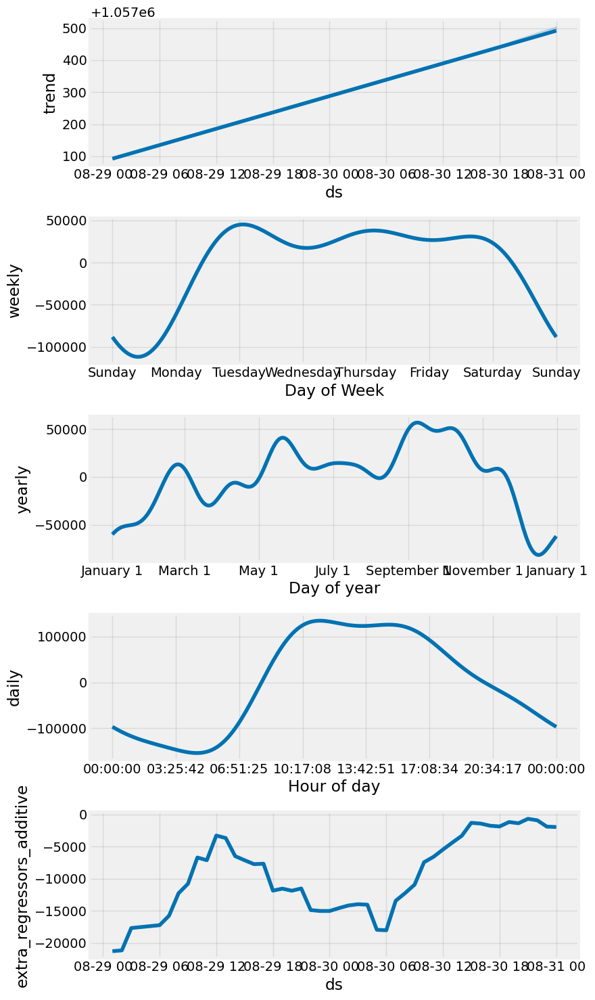

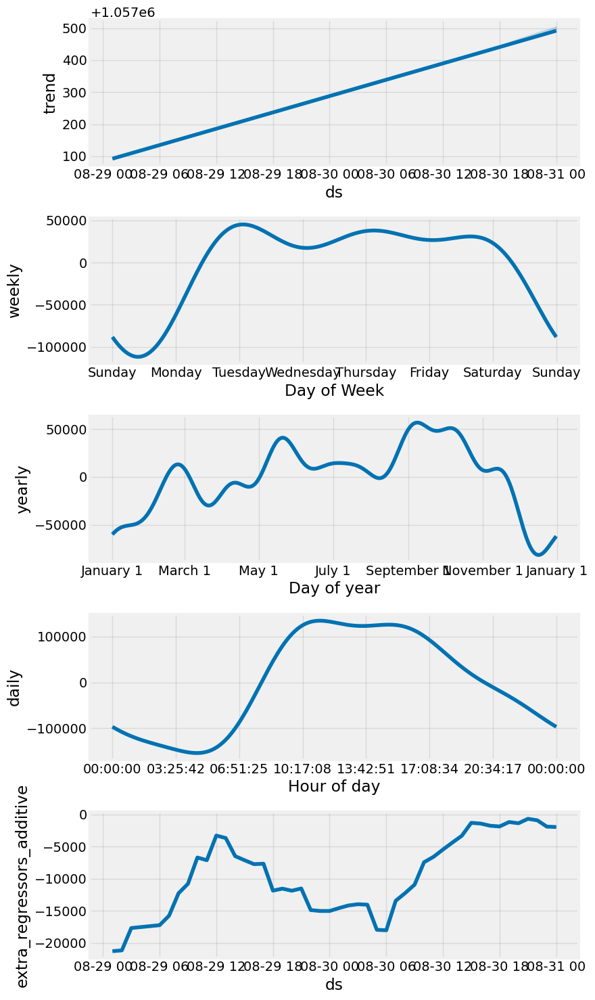

In [528]:
model.plot_components(test_forecast)

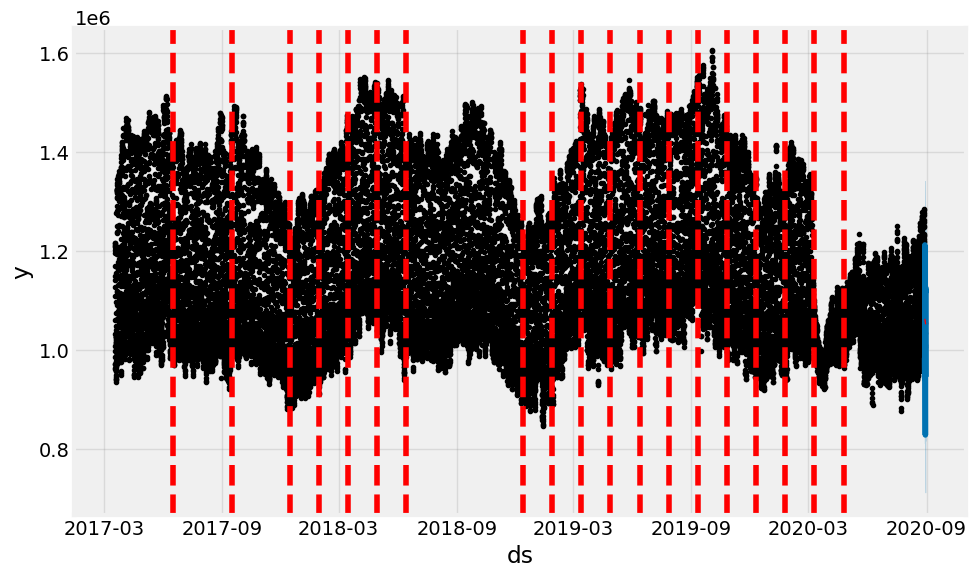

In [529]:
fig = model.plot(test_forecast)
a = add_changepoints_to_plot(fig.gca(), model, test_forecast)

In [530]:
model.changepoints

1089    2017-05-02 09:00:00
2177    2017-06-16 17:00:00
3266    2017-08-01 02:00:00
4354    2017-09-15 10:00:00
5443    2017-10-30 19:00:00
6532    2017-12-15 04:00:00
7620    2018-01-29 12:00:00
8709    2018-03-15 21:00:00
9797    2018-04-30 05:00:00
10886   2018-06-14 14:00:00
11975   2018-07-29 23:00:00
13063   2018-09-13 07:00:00
14152   2018-10-28 16:00:00
15240   2018-12-13 00:00:00
16329   2019-01-27 09:00:00
17418   2019-03-13 18:00:00
18506   2019-04-28 02:00:00
19595   2019-06-12 11:00:00
20683   2019-07-27 19:00:00
21772   2019-09-11 04:00:00
22861   2019-10-26 13:00:00
23949   2019-12-10 21:00:00
25038   2020-01-25 06:00:00
26126   2020-03-10 14:00:00
27215   2020-04-24 23:00:00
Name: ds, dtype: datetime64[ns]

adding error measures:

In [553]:
def calculate_mae(actual, predicted):
    n = len(actual)
    sum = 0
    for i in range(n):
        sum += abs(actual[i] - predicted[i])
        
    error = sum/n
    return round(error, 3)

def calculate_mape(actual, predicted):
    APE = []
    n = len(actual)
    # Iterate over the list values
    for i in range(n):
        # Calculate percentage error
        per_err = (actual[i] - predicted[i]) / actual[i]
        per_err = abs(per_err)
        # Append it to the APE list
        APE.append(per_err)
    # Calculate the MAPE
    MAPE = sum(APE)/len(APE)
    return round(MAPE, 3)

def calculate_rmse(actual, predicted):
    return round(math.sqrt(mean_squared_error(actual, predicted)), 3)

def get_error_measures(actual, predicted):
    result = "MAE: " + str(calculate_mae(actual, predicted)) + "\n"
    result += "MAPE: " + str(calculate_mape(actual, predicted)) + "\n"
    result += "RMSE: " + str(calculate_rmse(actual, predicted)) + "\n"
    return result

def get_error_measures_nums(actual, predicted):
#     print("MAE: " + str(calculate_mae(actual, predicted)))
#     print("MAPE: " + str(calculate_mape(actual, predicted)))
#     print("RMSE: " + str(calculate_rmse(actual, predicted)))
    return calculate_mae(actual, predicted), calculate_mape(actual, predicted), calculate_rmse(actual, predicted)

In [362]:
#first try
print(get_error_measures( list(test_data['y'][:48]), list(test_forecast['yhat'])))

MAE: 57260.427
MAPE: 0.056
RMSE: 69081.675



In [384]:
#second try, adding changepoints : 1 
print(get_error_measures( list(test_data['y'][:48]), list(test_forecast['yhat'])))

MAE: 58274.034
MAPE: 0.057
RMSE: 70118.113



maybe it overfit by including more change points?

In [397]:
#third try, adding changepoints : 0.8, prior_scale: 0.08 (more flexible)
print(get_error_measures( list(test_data['y'][:48]), list(test_forecast['yhat'])))

MAE: 57496.469
MAPE: 0.056
RMSE: 69250.233



first try is still better

In [406]:
#third try, adding changepoints : 1, prior_scale: 0.08 (more flexible)
print(get_error_measures( list(test_data['y'][:48]), list(test_forecast['yhat'])))

MAE: 58745.298
MAPE: 0.058
RMSE: 70658.677



ok setting changepoints to 1 is definitely too much

In [415]:
#fourth try, adding changepoints : 0.9, prior_scale: 0.08 (more flexible)
print(get_error_measures( list(test_data['y'][:48]), list(test_forecast['yhat'])))

MAE: 57477.01
MAPE: 0.056
RMSE: 69294.861



In [427]:
#fifth try, adding changepoints : 0.9, prior_scale: 0.001 (much less flexible)
print(get_error_measures( list(test_data['y'][:48]), list(test_forecast['yhat'])))

MAE: 65864.391
MAPE: 0.066
RMSE: 86710.588



Definitely the worst lmao

In [437]:
#sixth try, adding changepoints : 0.9, prior_scale: 0.04 
print(get_error_measures( list(test_data['y'][:48]), list(test_forecast['yhat'])))

MAE: 57403.576
MAPE: 0.056
RMSE: 69257.055



In [447]:
#sixth try, adding changepoints : 0.9, no prior scale
print(get_error_measures( list(test_data['y'][:48]), list(test_forecast['yhat'])))

MAE: 57386.918
MAPE: 0.056
RMSE: 69227.25



Ironically when I dont include changepoints from covid onwards it performs better?

In [467]:
#sixth try, doing 85 15 data split
print(get_error_measures( list(test_data['y'][:48]), list(test_forecast['yhat'])))

MAE: 69659.939
MAPE: 0.072
RMSE: 81936.941



In [531]:
#sixth try, doing 90 10 data split, using forecast values only
print(get_error_measures( list(test_data['y'][:48]), list(test_forecast['yhat'])))

MAE: 57675.827
MAPE: 0.057
RMSE: 69676.335



### Testing the model:

In [504]:
def add_regs_to_future(future, regs, actuals, i):
    for col in forecast_columns:
        start = 48*i
        end = 48*i + 48
        future[col] = regs[col][i:i+48]
    
    for col in actuals:
        future[col] = None
    return future

In [543]:
def split_data_bins(df):
    # Set the bin size (number of rows in each bin)
    bin_size = 48

    # Calculate the total number of bins
    num_bins = len(df) // bin_size

    # Calculate the number of remaining rows
    remaining_rows = len(df) % bin_size

    # Initialize an empty list to store data bins
    data_bins = []

    # Split the data into bins
    for i in range(num_bins):
        start_idx = i * bin_size
        end_idx = (i + 1) * bin_size
        bin_data = df[start_idx:end_idx]
        data_bins.append(bin_data)

    # Handle remaining rows
    if remaining_rows > 0:
        remaining_data = df[num_bins * bin_size:]
        data_bins.append(remaining_data)
    
    return data_bins

In [565]:
def get_test_results(horizons, model):
    
    mae_scores = []
    mape_scores = []
    rmse_scores = []
    
    actuals = []
    forecasts = []
    for horizon in horizons:
        future= horizon.drop(columns='y')
        forecast_values = model.predict(future)
        actual_y = list(horizon['y'])
        forecasted_y = list(forecast_values['yhat'])
#         mae, mape, rmse = get_error_measures_nums(actual_y, forecasted_y)
#         mae_scores.append(mae)
#         mape_scores.append(mape)
#         rmse_scores.append(rmse)
        
        actuals += actual_y
        forecasts += forecasted_y
                   
#     print(mae_scores)
#     print(mape_scores)
#     print(rmse_scores)
        
    mae, mape, rmse = get_error_measures_nums(actuals, forecasts)
    print(mae)
    print(mape)
    print(rmse)
    
    return mae, mape, rmse, actuals, forecasts


In [566]:
horizons = split_data_bins(test_data)

_, _, _, actuals, forecasts = get_test_results(horizons, model)

52114.692
0.049
66781.412


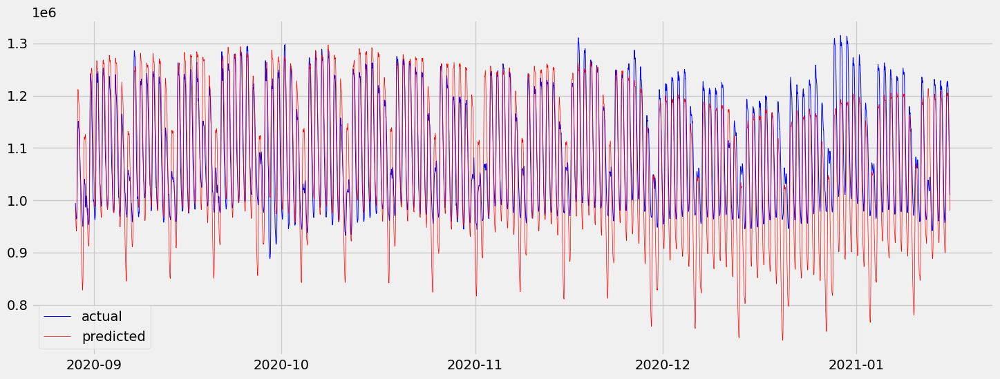

In [569]:
plt.figure(figsize=(16,6))
plt.plot(test_data['ds'], actuals, color='blue', label='actual', linewidth=0.7)
plt.plot(test_data['ds'], forecasts, color='red', label='predicted', linewidth=0.5)
plt.legend()

In [572]:
len(actuals) / 20

167.95

### Trying backtesting:

In [ ]:
def backtesting_prophet(df):
    # Specify window parameters
    window_size = 168  # Number of days in each training window
    forecast_horizon = 48  # Number of hours to forecast

    # Initialize lists to store evaluation metrics
    mae_scores = []
    mape_scores = []
    rmse_scores = []
    
    regressors = []

    # Iterate through the data using sliding windows
    for i in range(len(df) - window_size - forecast_horizon + 1):
        # Extract the current training window
        train_window = df[i : i + window_size]

        # Create the future DataFrame for forecasting
        future = pd.DataFrame({'ds': pd.date_range(start=train_window['ds'].iloc[-1], periods=forecast_horizon + 1, freq='H')[1:]})
#         future['regressor1'] = train_window['regressor1'].iloc[-1]
#         future['regressor2'] = train_window['regressor2'].iloc[-1]

        # Initialize and fit the Prophet model
        model = Prophet()
        model.add_regressor('regressor1')
        model.add_regressor('regressor2')
        model.fit(train_window[['ds', 'y', 'regressor1', 'regressor2']])

        # Make forecasts for the forecast horizon
        forecast = model.predict(future)

        # Extract forecasted values
        forecast_values = forecast['yhat'].values

        # Calculate evaluation metrics
        actual_values = df['y'].iloc[i + window_size:i + window_size + forecast_horizon]
        mae = mean_absolute_error(actual_values, forecast_values)
        rmse = mean_squared_error(actual_values, forecast_values, squared=False)

        mae_scores.append(mae)
        rmse_scores.append(rmse)

In [ ]:
trainsplit_data(fb_data, 0.1)